# Training and validation

In this notebook, we discuss the configuration file used by `lartpc_mlreco3d` to drive a machine-learning algorithm and how they can be used to train (optimize) a neural network and validate its performance on an independant dataset. As a case study, we'll test this out on the *semantic segmentation* task which is performed by a model called *UResNet*.

<figure>
<img src="https://edbatista.typepad.com/edbatista/images/2006/02/Full_Metal_Jacket_small.jpg" style="width:40%">
<figcaption align = "center"> You teaching the network to recognize Michel electrons </figcaption>
</figure>

## I. Configuration file

A configuration file for training/validating are writen using the YAML syntax and consists of three main blocks:
- `iotool` which specifies how to load and massage data to be fed to the model
- `model` which defines the model to used
- `trainval` which defines the training/validation process to be executed

Let's look at them sequentially.

In [1]:
import sys

SOFTWARE_DIR = '/sdf/group/neutrino/drielsma/lartpc_mlreco3d' # Change this path to your software install
DATA_DIR = '/sdf/group/neutrino/icarus/workshop2023/' # Change this path if you are not on SDF (see main README)

# Set software directory
sys.path.append(SOFTWARE_DIR)

***
### I/O tools

You've just seen this one in the input visualization discussion in the previous notebook, but let's take a quick look again and discuss some considerations when setting parameters for training purposes:

```yaml
iotool:
  batch_size: 64
  shuffle: False
  num_workers: 4
  collate_fn: CollateSparse
  sampler:
    name: RandomSequenceSampler
  dataset:
    name: LArCVDataset
    data_keys:
      #- /sdf/group/neutrino/ldomine/mpvmpr_112022_v0[6,7,8,9]/all*.root
      #- /sdf/group/neutrino/ldomine/mpvmpr_112022_v10/all*.root
    limit_num_files: -1
    skip_event_list: /sdf/group/neutrino/drielsma/me/train/icarus_localized/icarus_localized_train_skip_event_list.txt
    schema:
      input_data:
        parser: parse_sparse3d
        args:
          sparse_event_list:
            - sparse3d_reco_cryoE_rescaled
      segment_label:
        parser: parse_sparse3d
        args:
          sparse_event_list:
            - sparse3d_pcluster_semantics
```

A few considerations:
- `batch_size` is mostly driven by memory useage. A large `batch_size` reduces stochastic fluctuation batch-to-batch but there's only so many images one can fit on a GPU (along with the gradients that the network computes). This might take some trial and error to figure out how much memory how many one can fit before the memory saturates
- `num_workers` specifies the number of CPUs working on data loading. As long as the execution time is mostly driven by the network forward + backward execution, no need to increase that number.
- `sampler` should be randomized using `RandomSequenceSampler` to ensure that images are not always combined in the same way (slows down overtraining)
- `dataset` specifies how the data gets loaded, which was covered previously.

***
### Model

This block covers the network configuration and looks like this:

```yaml
model:
  name: uresnet
  modules:
    uresnet_lonely:
      num_input: 1
      num_classes: 5
      filters: 32
      depth: 5
      reps: 2
      spatial_size: 6144
      activation:
        name: lrelu
        args:
          negative_slope: 0.33
      allow_bias: False
      weight_loss: False
      norm_layer:
        name: batch_norm
        args:
          eps: 0.0001
          momentum: 0.01
  network_input:
    - input_data
  loss_input:
    - segment_label
```

Here are a high level description of what this does:
- `name` specifies the name of the model as defined under [`mlreco.models.factories`](https://github.com/DeepLearnPhysics/lartpc_mlreco3d/blob/develop/mlreco/models/factories.py). If you were to check the line with `uresnet`, you'd see this:   `"uresnet": (uresnet.UResNet_Chain, uresnet.SegmentationLoss)`
  - The first item in the list is the PyTorch model description
  - The second item is the PyTorch loss description
  - More detail can be found under [`mlreco.models.uresnet`](https://github.com/DeepLearnPhysics/lartpc_mlreco3d/blob/develop/mlreco/models/factories.py)
- `modules` contains the list of modules that make up the model. In this case, there is only one, but if one was to look at the full chain, you'd see seven.
  - `uresnet_lonely` is the name of the network within `mlreco.utils.uresnet`, hence the name of the block. The content of that block species specific network paramters, e.g. `num_input` for the number of input features (rescaled charge), `num_classes` for the number of target classes, etc.
- `network_input` specifies the input to the network, as defined in the I/O tool block
- `loss_input` specifies the input to the loss function, as defined in the I/O tool block

***
### Trainval

This block covers the training/validation regiment:

```yaml
trainval:
  seed: 123
  unwrap: False
  gpus: '0'
  weight_prefix: /sdf/group/neutrino/drielsma/train/icarus/localized/weights/uresnet/default/snapshot
  iterations: 100000 # 249480/64 -> 4000/epoch -> ~25 epochs
  report_step: 1
  checkpoint_step: 2000 # 2000/4000 ~ 1/2 epoch
  model_path: ''
  log_dir: /sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default
  train: True
  optimizer:
    name: Adam
    args:
      lr: 0.001
```

A lot of intersting things to see here:
- `seed`: Random seed used. If you use the same seed, you should get identical results. This is particularly useful when trying to debug something to know that you're looking at the same batch of images at the same iteration!
- `unwrap`: Whether or not to break down the input/output of the network image-wise within a batch. This is useful for visualization/storage, but useless during traing, so it should be kept `False` to save time
- `gpus`: Currently only supports `0` (one GPU). The CPU mode (`''`) gives inconsistent results with `MinkowskiEngine` and the multi-GPU mode is on the list of upcoming upgrades.
- `weight_prefix`: where to store the weights, i.e. the optimized parameters of the network
- `iterations`: Number of iterations to run. This number should be sufficient to get to the best set of weights, without overtaining the network (waste of time and resources). This takes some experience to figure out but ~25 epochs is a good target with this dataset, when training from scratch.
- `report_step`: How often to store the training loss/accuracy and other interest parameters during training (here at every iteration)
- `checkpoint_step`: How often to store the network weights. You don't wanna do that too often to limit the memory useage (a weightfile for this network is ~ 80 MB), but you also want some level of granularity for the validation process. Also note that if the process crashes, for whatever reason, having relatively recent weights helps picking up where you left off quicker. Here I picked to store every 0.5 epoch, but you could take that down to every 1 epoch.
- `model_path`: Path to model weights to initialize the model with. If you're picking up a training that was already started, specify the path to the latest and greatest here
- `log_dir`: Path to the log directory where the training loss/accuracy/etc. will be stored
- `train`: Whether to optimize the network weights or not, during train this must be `True`
- `debug`: If True, turns on some debugging messages
- `optimizer`: Name of the PyTorch optimizer to use, here [Adam](https://optimization.cbe.cornell.edu/index.php?title=Adam#:~:text=Adam%20optimizer%20is%20the%20extended,processing%20in%20the%20future%20years.)

***
***
## II. Running training

To start a training process, once you're armed with your config, it's a piece of cake. Log into SDF and then there's two options. You can use `srun` to submit a job to slurm directly like so:

***
### SLURM's srun

```shell
srun --account=shared --partition=shared --job-name=train_uresnet --output=log.out --error=log.err --ntasks=5 --cpus-per-task=4 --mem-per-cpu=4g --time=48:00:00 --gpus a100:1 singularity exec --bind /sdf/group/neutrino/drielsma/,/sdf/group/neutrino/ldomine/ --nv /sdf/group/neutrino/images/develop.sif bash -c "python3 /sdf/group/neutrino/drielsma/lartpc_mlreco3d/bin/run.py /sdf/group/neutrino/drielsma/train/icarus/localized/uresnet.cfg" &
```

A lot to see here. Let's start with the `srun` options:
- `account`: account to run on
  - `shared` is the lowest priority account. If SDF is in a resource crunch, your job will get automatically killed
  - `ml` and `neutrino` have dedicated GPUs, but be a good citizen and don't abuse resources! `neutrino`'s A100s have been moved to S3DF, so you should move there, eventually.
- `partition`: as far SDF is concerned, same-same. On S3DF, specifies the GPU class (e.g. `ampere`). To visualize available resources, one can do `sinfo -all`:
- `job-name`: how the job appears in squeue, e.g.
```shell
$ squeue | grep drielsma
           9176141        ml train_ur drielsma  R      22:53      1 ampt008
```
- `output`: file in which to store the output of stdout
- `ntasks`: number of processes to run (1)
- `cpus-per-task`: how many CPU cores are needed (here just 1 per data loader + the main process)
- `mem-per-cpu`: RAM per CPU (here 20 GB total for the whole process)
- `time`: Execution time (this model takes ~1.5 days to train from scratch on an A100 + some headroom)
- `gpus`: What and how many GPU to request (here 1 A100, the best GPU available on SDF/S3DF)
- `error`: file in which to store the output of stderr (can be the same as `output`)

As for the command, let's break it down:
```shell
singularity exec --bind /sdf/group/neutrino/drielsma/,/sdf/group/neutrino/ldomine/ --nv /sdf/group/neutrino/images/develop.sif bash -c "python3 /sdf/group/neutrino/drielsma/lartpc_mlreco3d/bin/run.py /sdf/group/neutrino/drielsma/train/icarus/localized/uresnet.cfg" &
```

`singularity` is similar to docker, it loads an image file (`.sif`) which contains all the necessary dependencies so noone has to build 100 packages locally:
- `exec`: executes a command within the singularity
- `--bind`: binds specific directories necessary to the training. Here one directory contains the code and the training configuration, while the other contains the the datafiles
- `--nv`: sets up the environment to use an Nvidia GPU
- `bash -c`: runs a command in a bash shell
- `python3 ...`: actual training command
  - `/sdf/group/neutrino/drielsma/lartpc_mlreco3d/bin/run.py` is the `lartpc_mlreco3d` executable
  - `/sdf/group/neutrino/drielsma/train/icarus/localized/uresnet.cfg` is the configuration
- `&`: detach it from the window

***
### SLURM's sbatch

Another approach is to create a sbatch file, let's say `train_uresnet.sh`, which looks like this:

```bash
#!/bin/bash 

#SBATCH --account=shared
#SBATCH --partition=shared

#SBATCH --job-name=train_uresnet
#SBATCH --output=log.out
#SBATCH --error=log.err

#SBATCH --ntasks=1
#SBATCH --cpus-per-task=5
#SBATCH --mem-per-cpu=4g
#SBATCH --time=48:00:00 
#SBATCH --gpus a100:1

singularity exec --bind /sdf/group/neutrino/drielsma/,/sdf/group/neutrino/ldomine/ --nv /sdf/group/neutrino/images/develop.sif bash -c "python3 /sdf/group/neutrino/drielsma/lartpc_mlreco3d/bin/run.py /sdf/group/neutrino/drielsma/train/icarus/localized/uresnet.cfg"
```

Which you can run simply by doing
```
sbatch train_uresnet.sh
```
(this is my personal preferred option to keep a record of how I execute training regiments).

***
### SLURM's scancel

To kill a job, simply find out its ID using squeue:

```shell
$ squeue | grep drielsma
           9176141        ml train_ur drielsma  R      22:53      1 ampt008
```
and then kill using the process ID
```shell
$ scancel 9176141
```
done!

***
***
## III. Visualizing training

Now let's take a look at what the training log looks like. It's a CSV file so we can load it up easily with Pandas:

In [2]:
import pandas as pd

path = '/sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/train_log-0000000.csv' # FIX PATH NAME
df = pd.read_csv(path)
df

,iter,first_id,epoch,titer,tsum,tio,tsumio,mem,tforwardcpu,tbackwardcpu,...,tsave,tsumtrain,tsumsave,accuracy,loss,accuracy_class_0,accuracy_class_1,accuracy_class_2,accuracy_class_3,accuracy_class_4
0,0,142547,0.000000,16.516455,16.516455,2.093401,2.093401,11.443,5.314007,0.559526,...,0.000002,16.516407,0.0,0.245769,1.633958,0.260931,0.247213,0.046640,0.196190,0.170718
1,1,28204,0.000265,1.375128,17.891583,0.026257,2.119658,17.837,0.538009,0.716766,...,0.000005,17.888254,0.0,0.274789,1.584139,0.291012,0.280659,0.042935,0.188205,0.160797
2,2,212707,0.000531,1.582783,19.474366,0.146842,2.266500,19.101,0.544186,0.773921,...,0.000007,19.466908,0.0,0.298350,1.554605,0.291203,0.307186,0.052721,0.179181,0.142949
3,3,234579,0.000796,1.015044,20.489411,0.026157,2.292657,19.101,0.408586,0.526120,...,0.000007,20.476442,0.0,0.353350,1.525893,0.306174,0.373766,0.047716,0.157597,0.121593
4,4,37694,0.001061,1.460219,21.949630,0.146864,2.439521,19.101,0.437262,0.682069,...,0.000005,21.930735,0.0,0.399471,1.492422,0.289098,0.458311,0.042947,0.151723,0.103849
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,238718,26.530910,1.172272,120105.676880,0.009794,8470.457946,20.922,0.433431,0.625228,...,0.000006,119775.255907,0.0,0.990652,0.025002,0.988006,0.997083,0.860062,0.926447,0.904171
99996,99996,204484,26.531175,1.112956,120106.789836,0.009548,8470.467494,20.922,0.451846,0.595769,...,0.000007,119776.366029,0.0,0.990346,0.026923,0.986200,0.994940,0.961703,0.904901,0.912212
99997,99997,226227,26.531441,1.136798,120107.926634,0.119852,8470.587346,20.922,0.398595,0.528250,...,0.000007,119777.497915,0.0,0.990695,0.024818,0.985924,0.996651,0.947019,0.904242,0.919954
99998,99998,169238,26.531706,1.323118,120109.249752,0.146410,8470.733755,20.922,0.445287,0.634818,...,0.000005,119778.817329,0.0,0.991228,0.024017,0.987468,0.996724,0.921621,0.911038,0.915485


Let's take look at the keys, specifically:

In [3]:
df.keys()

Index(['iter', 'first_id', 'epoch', 'titer', 'tsum', 'tio', 'tsumio', 'mem',
       'tforwardcpu', 'tbackwardcpu', 'ttrain', 'tsave', 'tsumtrain',
       'tsumsave', 'accuracy', 'loss', 'accuracy_class_0', 'accuracy_class_1',
       'accuracy_class_2', 'accuracy_class_3', 'accuracy_class_4'],
      dtype='object')

Some good stuff in here. Let's take a look at the time/memory profiling tools available to us:
- `iteration`: iteration count
- `first_id`: entry number in the input file of the first image in the batch
- `epoch`: epoch count, i.e. `iteration`*`batch_size`/`dataset_size`
- `titer`: time to complete the iteration
- `tsum`: total execution time since the training began
- `tio`: time spent on I/O
- `tsumio`: time spent on I/O since the training began
- `tforwardcpu`: CPU time spent during the network forward function
- `tbackwardcpu`: CPU time spent during the network backward process
- `ttrain`: training time for this iteration
- `tsave`: time spent on saving the log/weights
- `tsumtrain`: total time spent on training since the training began
- `tsumsave`: total time spent on saving since the training began
- `mem`: GPU memory usage

Let's take a look at iteration time and how I/O contibutes

<AxesSubplot: xlabel='iter'>

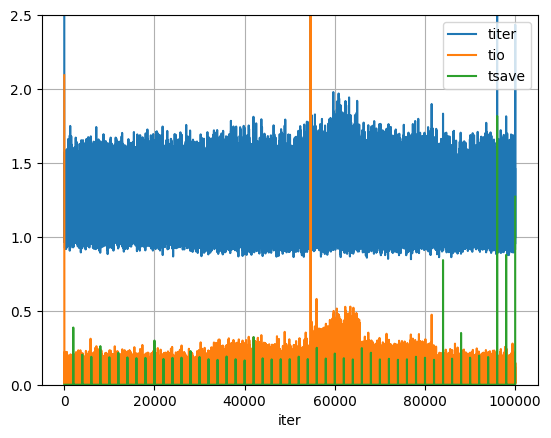

In [4]:
df.plot('iter', ['titer', 'tio', 'tsave'], ylim=[0,2.5], grid=True)

you can see that the training time dominates the execution time, which is what we like to see!

Let's also take a look at our memory consumption over time:

<AxesSubplot: xlabel='iter'>

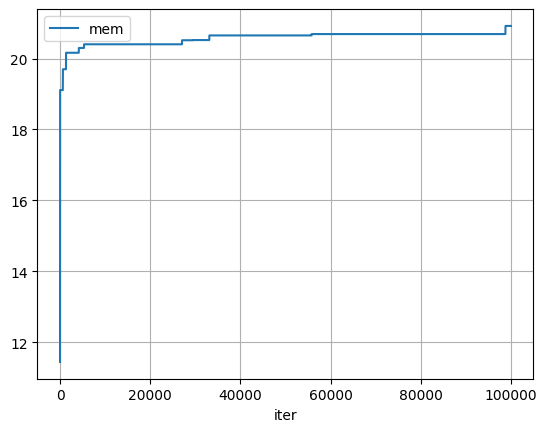

In [5]:
df.plot('iter', 'mem', grid=True)

you can see that the consumption quickly increases to ~20 GB and saturates there (memory is not cleared once it's claimed). We could probably fit a larger batch (the A100 has 40 GB of RAM), but it's good to keep some headroom.

Now let's check what else is there to look at:
- `accuracy`: Global pixel-wise accuracy of the UResNet-PPN output
- `loss`: Cross-entropy loss for all classes
- `accuracy_class_*`: Pixel-wise accuracy for each of the 5 classes (0: shower, 1: track, 2: Michel, 3: delta, 4: LE scatter)

First, lay thine eyes upon the loss and see that it is decreasing:

<AxesSubplot: xlabel='iter'>

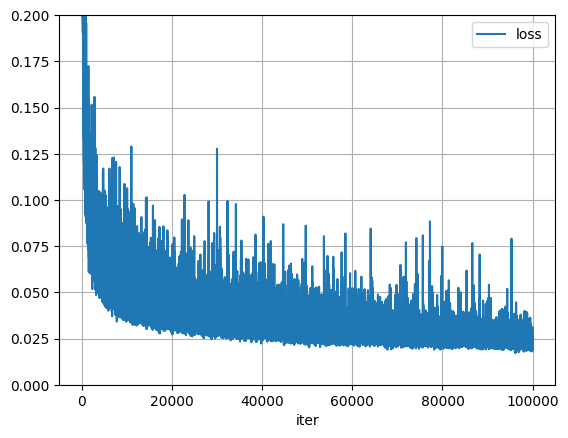

In [6]:
df.plot('iter', 'loss', ylim=[0,0.2], grid=True)

Nice. Now let's check the accuracies:

<AxesSubplot: xlabel='iter'>

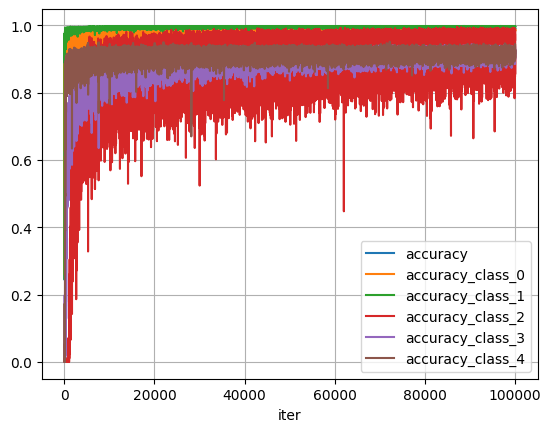

In [7]:
df.plot('iter', ['accuracy', 'accuracy_class_0', 'accuracy_class_1', 'accuracy_class_2', 'accuracy_class_3', 'accuracy_class_4'], grid=True)

This is as far as we can go with this log file. Note that a plotting tool exists as part of `lartpc_mlreco3d` to visualize the training. You do not have to use it but it simplifies things when e.g.
- Your training is broken up into multiple log files (start/stop training)
- You want to draw multiple model performance (separate training)
- You want an interactive plot

Let's setup the environment and take a quick look at how to use it

In [8]:
import sys

SOFTWARE_DIR = '/sdf/group/neutrino/drielsma/lartpc_mlreco3d' # Update if needed

# set software directory
sys.path.insert(0, SOFTWARE_DIR)

Welcome to JupyROOT 6.22/08


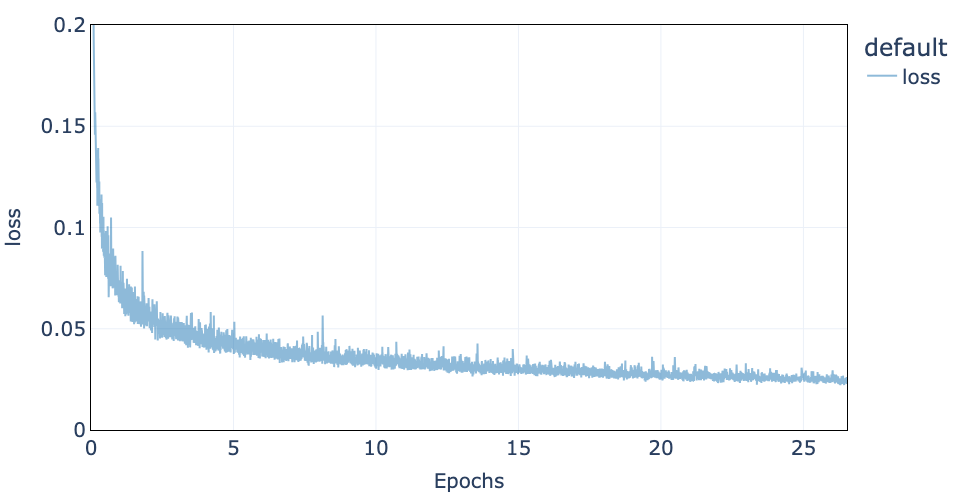

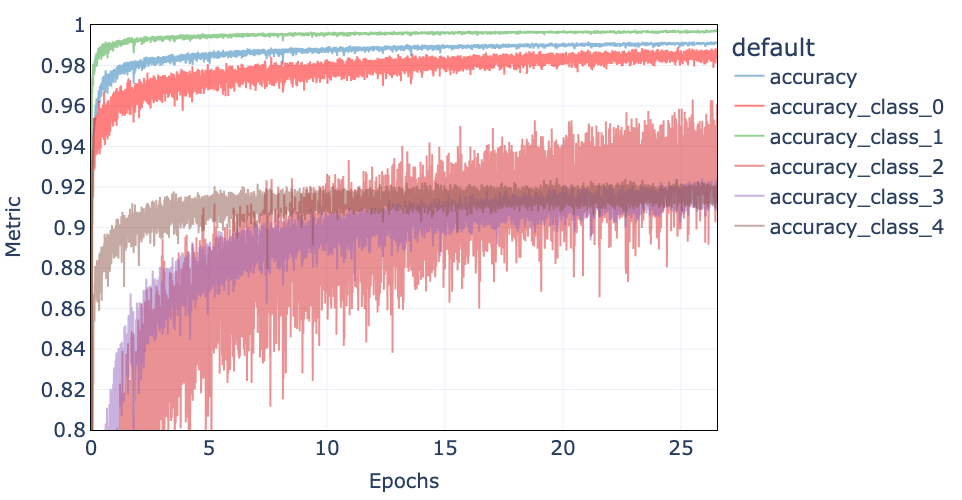

In [9]:
from mlreco.visualization.training import draw_training_curves

log_dir = '/sdf/group/neutrino/drielsma/train/icarus/localized/logs/'
draw_training_curves(log_dir+'/uresnet/',
                     models=['default'],
                     metrics=['loss'],
                     limits=[0.,.2], smoothing=10, step=10, print_min=True, leg_ncols=2, interactive=True, val_prefix='dummy')

draw_training_curves(log_dir+'/uresnet/',
                     models=['default'], 
                     metrics=['accuracy', 'accuracy_class_0', 'accuracy_class_1',
                              'accuracy_class_2', 'accuracy_class_3', 'accuracy_class_4'],
                     limits=[0.8,1.], step=10, smoothing=10, print_max=True, interactive=True, figure_name='uresnet_train', val_prefix='dummy')

For more options:

In [10]:
help(draw_training_curves)

Help on function draw_training_curves in module mlreco.visualization.training:

draw_training_curves(log_dir, models, metrics, limits={}, model_names={}, metric_names={}, max_iter=-1, step=1, smoothing=1, iter_per_epoch=-1, print_min=False, print_max=False, interactive=True, same_plot=True, paper=False, leg_ncols=1, figure_name='', train_prefix='train', val_prefix='inference')
    Finds all training and validation log files inside the specified 
    directory and draws an evolution plot of the request quantities.
    
    Args:
        log_dir (str)       : Path to the directory that contains the folder with log files
        models (list)       : List of model (folder) names under the main directory
        metrics (list)      : List of quantities to draw
        limits (list/dict)  : List of y boundaries for the plot (or dictionary of y boundaries, one per metric)
        model_names (dict)  : Dictionary which maps raw model names to model labels (default: `{}`)
        metric_names 

***
***
## IV. Running validation

It is crucial to keep a close eye on a training process after it has been started:
- Training can take of order days to converge, so identifying issues early is a signifcant time and resource saver
- Models can overfit the data if given enough time, monitoring the performance on an intendependant (validation) set is essential to assess it

<figure>
<img src="https://miro.medium.com/max/1125/1*_7OPgojau8hkiPUiHoGK_w.png" style="width:80%">
<figcaption align = "center"> Don't overfit! </figcaption>
</figure>

First, we need a validation configuration. As you can imagine, it is very similar to the train configuration, with a few key changes:
- Remove the `sampler` block from the `iotool` block: 
  - For validation, we want to check the performance at each checkpoint without any variations in the validation sample, so that variations in performance stricly represent differences in weight quality
- Change the `data_keys` in the `iotool` block from a training set to a validation dataset
  - They need to be independant, that's the whole point!
- Change the total number of `iterations` to a lower value, at most the size of the validation set
- Point `model_path` to the list model weights you've stored:
  - E.g. /sdf/group/neutrino/drielsma/train/icarus/localized/weights/snapshot*
- Turn `train` to `False` (inference mode)

Now you're ready to rock and roll. If you call your new config `uresnet_val.cfg`, simply call
```shell
python3 bin/run.py uresnet_val.cfg
```
preferably in the `sbatch` script or `srun` command!

What you get as a result is the following:

In [11]:
!ls /sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/

inference_log-0002000.csv  inference_log-0014000.csv  inference_log-0018000.csv
inference_log-0012000.csv  inference_log-0016000.csv  train_log-0000000.csv


For each weight file (every 2000 iterations), you get a log file with 400 entries which has the exact same structure as the train file. Each of these file corresponds to a specific iteration in the training and can validate whether the network performs as well on an independant set, or not!

***
***
## V. Visualization validation

Now let's take a look at the files. One way to this is to loop over the files and average over the quantities you are trying to validate, e.g.:

In [12]:
import pandas as pd

path = '/sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/train_log-0000000.csv' # FIX PATH NAME
df = pd.read_csv(path)
df

,iter,first_id,epoch,titer,tsum,tio,tsumio,mem,tforwardcpu,tbackwardcpu,...,tsave,tsumtrain,tsumsave,accuracy,loss,accuracy_class_0,accuracy_class_1,accuracy_class_2,accuracy_class_3,accuracy_class_4
0,0,142547,0.000000,16.516455,16.516455,2.093401,2.093401,11.443,5.314007,0.559526,...,0.000002,16.516407,0.0,0.245769,1.633958,0.260931,0.247213,0.046640,0.196190,0.170718
1,1,28204,0.000265,1.375128,17.891583,0.026257,2.119658,17.837,0.538009,0.716766,...,0.000005,17.888254,0.0,0.274789,1.584139,0.291012,0.280659,0.042935,0.188205,0.160797
2,2,212707,0.000531,1.582783,19.474366,0.146842,2.266500,19.101,0.544186,0.773921,...,0.000007,19.466908,0.0,0.298350,1.554605,0.291203,0.307186,0.052721,0.179181,0.142949
3,3,234579,0.000796,1.015044,20.489411,0.026157,2.292657,19.101,0.408586,0.526120,...,0.000007,20.476442,0.0,0.353350,1.525893,0.306174,0.373766,0.047716,0.157597,0.121593
4,4,37694,0.001061,1.460219,21.949630,0.146864,2.439521,19.101,0.437262,0.682069,...,0.000005,21.930735,0.0,0.399471,1.492422,0.289098,0.458311,0.042947,0.151723,0.103849
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,238718,26.530910,1.172272,120105.676880,0.009794,8470.457946,20.922,0.433431,0.625228,...,0.000006,119775.255907,0.0,0.990652,0.025002,0.988006,0.997083,0.860062,0.926447,0.904171
99996,99996,204484,26.531175,1.112956,120106.789836,0.009548,8470.467494,20.922,0.451846,0.595769,...,0.000007,119776.366029,0.0,0.990346,0.026923,0.986200,0.994940,0.961703,0.904901,0.912212
99997,99997,226227,26.531441,1.136798,120107.926634,0.119852,8470.587346,20.922,0.398595,0.528250,...,0.000007,119777.497915,0.0,0.990695,0.024818,0.985924,0.996651,0.947019,0.904242,0.919954
99998,99998,169238,26.531706,1.323118,120109.249752,0.146410,8470.733755,20.922,0.445287,0.634818,...,0.000005,119778.817329,0.0,0.991228,0.024017,0.987468,0.996724,0.921621,0.911038,0.915485


<AxesSubplot: xlabel='iter'>

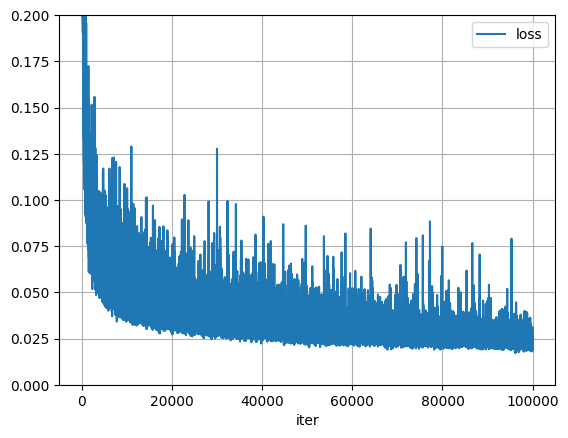

In [13]:
df.plot('iter', 'loss', ylim=[0,0.2], grid=True)

In [14]:
import glob

val_files = glob.glob('/sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/inference*')
print(val_files)

['/sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/inference_log-0012000.csv', '/sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/inference_log-0014000.csv', '/sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/inference_log-0018000.csv', '/sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/inference_log-0016000.csv', '/sdf/group/neutrino/drielsma/train/icarus/localized/logs/uresnet/default/inference_log-0002000.csv']


In [15]:
iterations = [int(f.split('-')[-1][:7]) for f in val_files]
losses = [pd.read_csv(f).loss.mean() for f in val_files]
stds = [pd.read_csv(f).loss.std() for f in val_files]
print(iterations)
print(losses)

[12000, 14000, 18000, 16000, 2000]
[0.05343790124170477, 0.04865328907966608, 0.04708480366971338, 0.055604261069442475, 0.08664587925239979]


<ErrorbarContainer object of 3 artists>

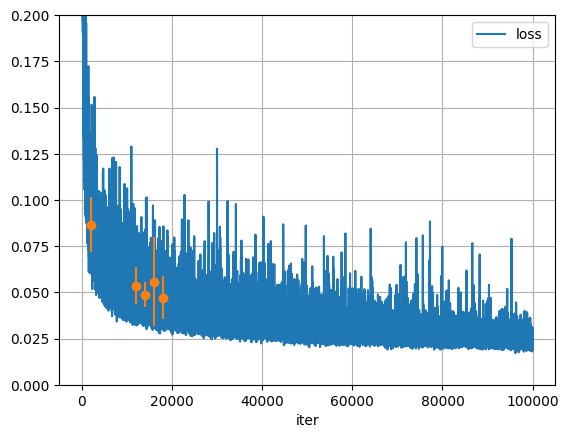

In [16]:
from matplotlib import pyplot as plt

df.plot('iter', 'loss', ylim=[0,0.2], grid=True)
plt.errorbar(iterations, losses, yerr=stds, fmt='o', label='loss (val)')

Or... simply use the tools available to you and let the magic happen!

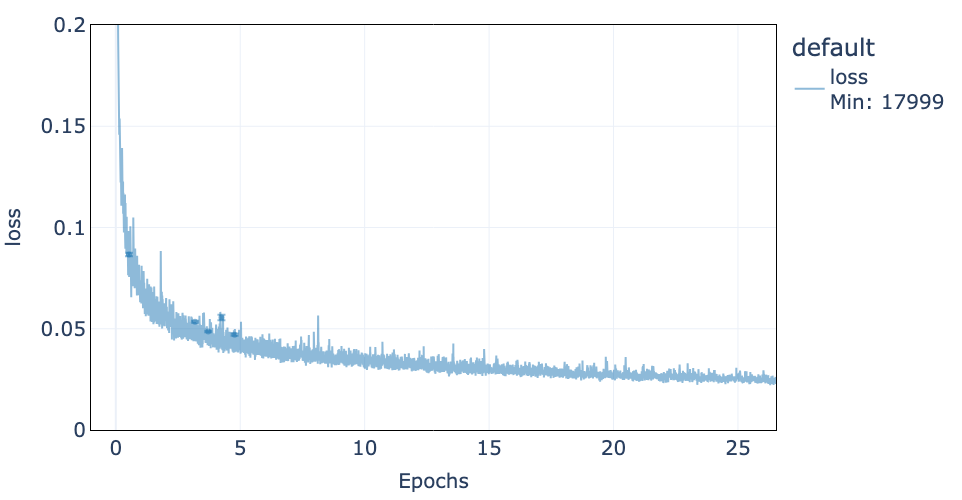

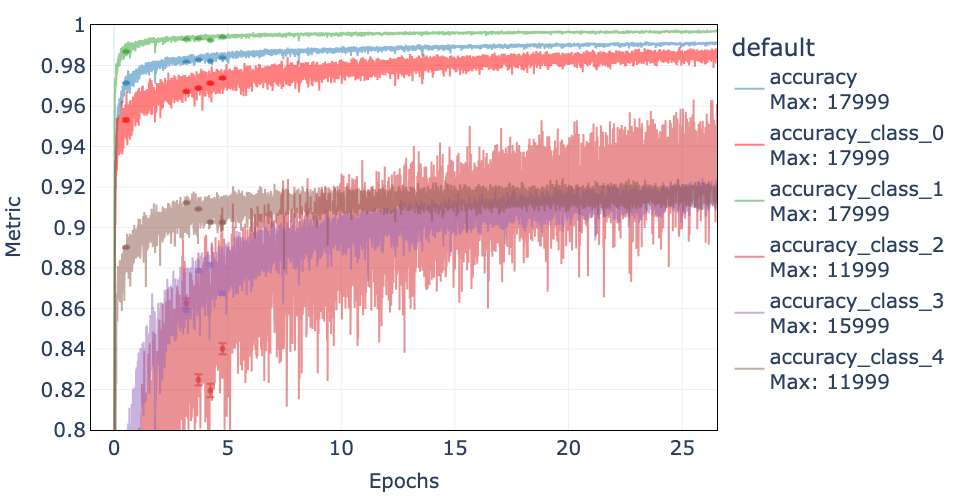

In [17]:
from mlreco.visualization.training import draw_training_curves

log_dir = '/sdf/group/neutrino/drielsma/train/icarus/localized/logs/'
draw_training_curves(log_dir+'/uresnet/',
                     models=['default'],
                     metrics=['loss'],
                     limits=[0.,.2], smoothing=10, step=10, print_min=True, leg_ncols=2, interactive=True)

draw_training_curves(log_dir+'/uresnet/',
                     models=['default'], 
                     metrics=['accuracy', 'accuracy_class_0', 'accuracy_class_1',
                              'accuracy_class_2', 'accuracy_class_3', 'accuracy_class_4'],
                     limits=[0.8,1.], step=10, smoothing=10, print_max=True, interactive=True, figure_name='uresnet_train')

***
***
## VI. Exercises

Here's a few suggestions of things to try out to familirize yourself with the process:
- Train uresnet using the provided configuration file. Modify the file to use the `mpvmpr_mini.root` dataset to speed up the process. Check the number of entries in the file and adapt the number of iterations accordingly! Skip the last 30 entries with the `skip_event_list` parameter to keep them for validation
- Run the validation using the last 30 entries in the file using the `event_list` parameter
- Try the same process to train grappa_shower (`grappa_shower.cfg` provided) with the `mpvmpr_mini.root` dataset
- Modify `grappa_shower.cfg` to `grappa_shower_val.cfg` to use for validation
- Visualize all of the above as you go!